## Preparation

### Import the needed package

In [1]:
# package to get the custom modules
import sys
# package for handling the environment variables
from dotenv import load_dotenv

# add the path to the custom modules
sys.path.insert(0, './../')
# load the environment variables
load_dotenv()

# package for handling the files
import os
# package for handling random numbers
from random import randint
# package for handling array
import numpy as np
# package for handling the metadata and tabular data
import pandas as pd
from itertools import chain
# the custom module for handling the data
import utilities as utils
# package for handling the machine learning model
import tensorflow as tf
# package for handling visualization
import matplotlib.pyplot as plt

c:\Users\Bugi\miniconda3\envs\modeling\lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
c:\Users\Bugi\miniconda3\envs\modeling\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.1 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.

### Global variables

In [2]:
# path variables
path_full = os.environ.get("ORI_PATH")
path_dataset_ori = os.path.join(path_full, "datasets", "splitted", "original", "test")
path_dataset_aug = os.path.join(path_full, "datasets", "splitted", "augmented", "test")
path_cdr_data = os.path.join(path_full, "data", "cdr_dataset.csv")
# model names
models_name = ["unet_model_ori", "unet_model_aug", "mnet_model_ori", "mnet_model_aug", "efnet_model_ori", "efnet_model_aug"]

### Get CDR value from the dataset

In [3]:
cdr_data = pd.read_csv(path_cdr_data)
cdr_data.head(5)

,id,label,eye_side,a_cdr,v_cdr,h_cdr
0,fff_0_111784_l_y_mask,0,l,0.340206,0.633803,0.560606
1,fff_0_111784_r_y_mask,0,r,0.300445,0.541667,0.538462
2,fff_0_113060_l_1_mask,0,l,0.473950,0.686275,0.670000
3,fff_0_113060_l_2_mask,0,l,0.516781,0.777778,0.680000
4,fff_0_113060_l_3_mask,0,l,0.491304,0.721154,0.697917


### Get the existing test image

In [4]:
# get the fundus images list from the testset
f_images_ori = [img for img in os.listdir(path_dataset_ori) if img.endswith(".jpg")]
f_images_aug = [img for img in os.listdir(path_dataset_aug) if img.endswith(".jpg")]
# merge the list
f_images = list(chain(f_images_ori, f_images_aug))
# convert the list to a dataframe
test_img = pd.DataFrame(f_images, columns=["image"])

# extract the information
test_img["id"] = test_img["image"].apply(lambda x: x.split(".")[0])         # get the id of the image
test_img = test_img[['id', 'image']]                                        # rearrange the columns order
test_img["label"] = test_img["id"].apply(lambda x: x.split("_")[1])         # get the label of the image
test_img["eye_side"] = test_img["id"].apply(lambda x: x.split("_")[3])      # get the eye side of the image
test_img.loc[~test_img.id.str.contains("aug"),"image"] = test_img.loc[~test_img.id.str.contains("aug"),
                                                                        "image"].apply(lambda x: os.path.join(path_dataset_ori, x)) # get the full path of image for original dataset
test_img.loc[test_img.id.str.contains("aug"), "image"] = test_img.loc[test_img.id.str.contains("aug"),
                                                                        "image"].apply(lambda x: os.path.join(path_dataset_aug, x)) # get the full path of image for augmented dataset
test_img.rename(columns={"image": "path"}, inplace=True)                    # rename the column image to path

# show the data information
print(f"Data length: {len(test_img)}")

Data length: 142


In [5]:
# filter the original images
test_img_ori = test_img.loc[~test_img.id.str.contains("aug")]

# reset the index
test_img_ori.reset_index(drop=True, inplace=True)

# show the data information
print(f"Data length: {len(test_img_ori)}")
# show data content
test_img_ori.drop(columns=["path"]).head(3)

Data length: 71


,id,label,eye_side
0,fff_0_115058_l_1,0,l
1,fff_0_115058_r_3,0,r
2,fff_0_121076_r_1,0,r


In [6]:
# filter the augmented images
test_img_aug = test_img.loc[test_img.id.str.contains("aug")]

# reset the index
test_img_aug.reset_index(drop=True, inplace=True)

# show the data information
print(f"Data length: {len(test_img_aug)}")
# show data content
test_img_aug.drop(columns=["path"]).head(3)

Data length: 71


,id,label,eye_side
0,fff_0_115058_l_1_aug,0,l
1,fff_0_115058_r_3_aug,0,r
2,fff_0_121076_r_1_aug,0,r


### Get the model

In [119]:
# dictionary to store the models
model = {}
# load the models
for model_name in models_name:
    model[model_name] = utils.custom_load_model(os.path.join(path_full,
                                                                "data",
                                                                "model",
                                                                f"{model_name}.h5"))

## Get the Loss Value
- Populate the data with loss value from CDR on mask predicted image and CDR on mask dataset image.
- Find the best treshold

### Automate Function

In [120]:
def get_cdr_data_aug(model_name:str, row:pd.Series, path_dataset:str, threshold:float):
    """get the CDR data for the augmented dataset

    Args:
        model_name (str): the name of the model
        row (pd.Series): the row of the data
        path_dataset (str): the path to the dataset
        threshold (float): the threshold value for the CDR

    Returns:
        list: the list of the CDR data to be stored as a row
    """
    try:
        # get the CDR data
        result = list(utils.ev_cdr(model=model[model_name],
                                img_path=row.path,
                                mask_path=os.path.join(path_dataset,
                                                        f"{row.id.replace('aug', 'mask')}.png"),
                                threshold=threshold).values())
    except:
        # show the error message and specific image
        print(f"Error on image {row.id}")
        plt.imshow(plt.imread(row.path))
        plt.title(row.id)
        plt.show()
        return "failed"
    # return the result
    return [row.id, *result]

In [121]:
def get_cdr_data_ori(model_name:str, row:pd.Series, path_dataset:str, threshold:float):
    """get the CDR data for the original dataset

    Args:
        model_name (str): the name of the model
        row (pd.Series): the row of the data
        path_dataset (str): the path to the dataset
        threshold (float): the threshold value for the CDR

    Returns:
        list: the list of the CDR data to be stored as a row
    """
    try:
        # get the CDR data
        result = list(utils.ev_cdr(model=model[model_name],
                                img_path=row.path,
                                mask_path=os.path.join(path_dataset,
                                                        f"{row.id}_mask.png"),
                                threshold=threshold).values())
    except:
        # show the error message and specific image
        print(f"Error on image {row.id}")
        plt.imshow(plt.imread(row.path))
        plt.title(row.id)
        plt.show()
        return "failed"
    # return the result
    return [row.id, *result]

In [122]:
def highlight_max(series:pd.Series):
    """highlight the maximum value in the series

    Args:
        series (pd.Series): the series to be highlighted

    Returns:
        list: the list of the style
    """
    is_max = series == series.min()
    return ['background-color: yellow;color: black' if value else '' for value in is_max]

In [123]:
# configure the experiment configuration
threshold_min = .2
threshold_max = .8
threshold_step = 30

### Unet

Threshold: 0.2
Threshold: 0.22
Threshold: 0.24
Threshold: 0.26
Threshold: 0.28
Threshold: 0.3
Threshold: 0.32
Threshold: 0.34
Threshold: 0.37
Threshold: 0.39
Threshold: 0.41
Threshold: 0.43
Threshold: 0.45
Threshold: 0.47
Threshold: 0.49
Threshold: 0.51
Threshold: 0.53
Threshold: 0.55
Threshold: 0.57
Threshold: 0.59
Threshold: 0.61
Threshold: 0.63
Threshold: 0.66
Threshold: 0.68
Threshold: 0.7
Threshold: 0.72
Threshold: 0.74
Threshold: 0.76
Error on image fff_1_64992_r_n


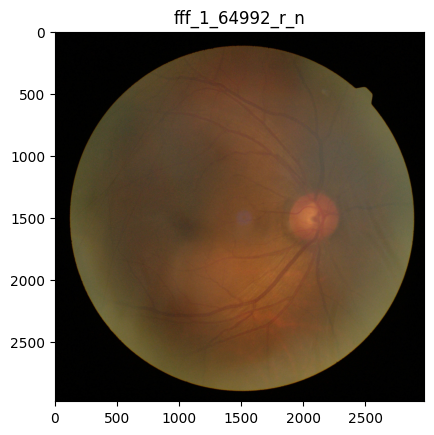

Error on threshold 0.76 for augmented dataset
Threshold: 0.78
Error on image fff_1_64992_r_n


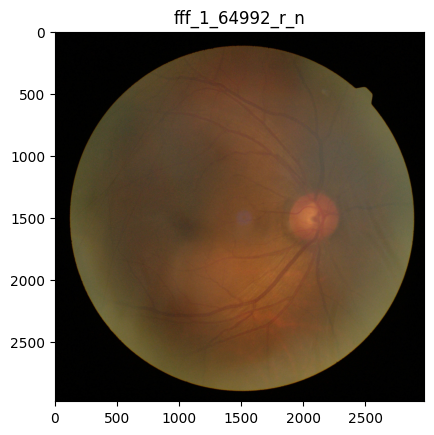

Error on threshold 0.78 for augmented dataset
Threshold: 0.8
Error on image fff_1_64992_r_n


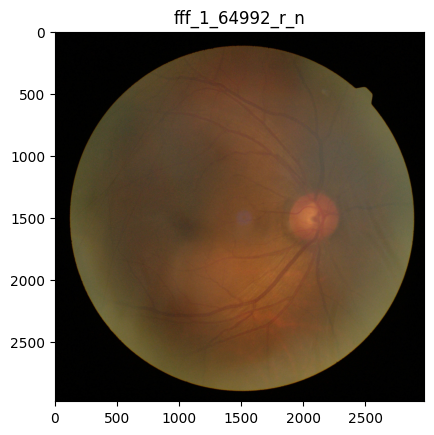

Error on threshold 0.8 for augmented dataset


In [124]:
########## count the loss value ##########
# initialize an empty dictionary to store the results
data_unet = {
    "ori": {},
    "aug": {}
}
# iterate over the threshold values
for i in np.linspace(threshold_min, threshold_max, threshold_step):
    # round the threshold value to two decimal places
    threshold = round(i, 2)
    print(f"Threshold: {threshold}")
    
    try:
        # create an empty dataframe to store the results
        result = pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
        # get the CDR value for each image on original dataset
        for idx, row in test_img_ori.iterrows():
            result.loc[idx] = get_cdr_data_ori("unet_model_ori", row, path_dataset_ori, threshold)
        # get the loss value
        data_unet["ori"][threshold] = utils.count_loss_cdr(cdr_data.drop(columns=["label", "eye_side"]), result)

        # create an empty dataframe to store the results
        result = pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
        # get the CDR value for each image on augmented dataset
        for idx, row in test_img_aug.iterrows():
            result.loc[idx] = get_cdr_data_aug("unet_model_aug", row, path_dataset_aug, threshold)
        # get the loss value
        data_unet["aug"][threshold] = utils.count_loss_cdr(cdr_data.drop(columns=["label", "eye_side"]), result)
    except:
        print(f"Error on threshold {threshold} for augmented dataset")

In [125]:
########## populate the loss dataframe ##########
# create an empty dataframe to store the results
loss_unet = pd.DataFrame(columns=['data_type', 'threshold', 'a_mse', 'a_mae', 'a_huber', 'h_mse', 'h_mae', 'h_huber', 'v_mse', 'v_mae', 'v_huber'])
# populate the dataframe
for data_type in ["ori", "aug"]:
    for key, value in data_unet[data_type].items():
        loss_unet.loc[len(loss_unet)] = [data_type, key, *list(value.values())]

loss_unet.sort_values(by=["v_huber", "v_mae"], ascending=True, inplace=True, ignore_index=True) # sort the dataframe
loss_unet.to_csv(os.path.join(path_full, "data", "loss_unet.csv"), index=False)                 # save the dataframe to csv
loss_unet_styled = loss_unet.style.apply(highlight_max, subset=loss_unet.columns[2:])           # highlight the minimum value
# show the dataframe
loss_unet_styled

,data_type,threshold,a_mse,a_mae,a_huber,h_mse,h_mae,h_huber,v_mse,v_mae,v_huber
0,ori,0.220000,0.018356,0.105884,0.009178,0.103488,0.138554,0.036595,0.022205,0.113943,0.011102
1,aug,0.740000,0.016957,0.099703,0.008479,0.768367,0.220656,0.114281,0.155436,0.145541,0.045442
2,ori,0.240000,0.018157,0.104793,0.009079,0.141534,0.158151,0.052322,0.208064,0.162268,0.054919
3,ori,0.260000,0.017806,0.103758,0.008903,0.142284,0.160455,0.052697,0.211033,0.166242,0.056403
4,ori,0.410000,0.017951,0.100999,0.008975,0.853003,0.257486,0.141612,0.250554,0.180512,0.071920
5,ori,0.370000,0.017666,0.101006,0.008833,0.322897,0.212453,0.092638,0.250591,0.181470,0.071938
6,ori,0.390000,0.017835,0.100905,0.008917,0.274679,0.203503,0.085313,0.251129,0.182853,0.072207
7,aug,0.700000,0.016838,0.099327,0.008419,0.763914,0.223884,0.112601,0.736075,0.200453,0.102474
8,aug,0.720000,0.016911,0.099304,0.008455,0.771718,0.228236,0.115957,0.736291,0.202609,0.102582
9,ori,0.320000,0.017344,0.101144,0.008672,0.847084,0.259545,0.139066,0.963966,0.232339,0.122887


### MobileNet

Threshold: 0.2
Threshold: 0.22
Threshold: 0.24
Threshold: 0.26
Threshold: 0.28
Threshold: 0.3
Threshold: 0.32
Threshold: 0.34
Threshold: 0.37
Threshold: 0.39
Threshold: 0.41
Threshold: 0.43
Threshold: 0.45
Threshold: 0.47
Threshold: 0.49
Threshold: 0.51
Threshold: 0.53
Error on image fff_1_87487_r_1_aug


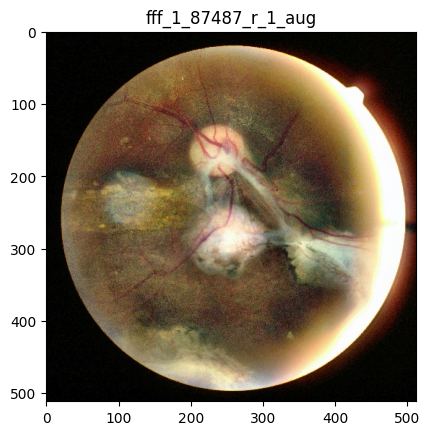

Error on threshold 0.53
Threshold: 0.55
Error on image fff_1_87487_r_1_aug


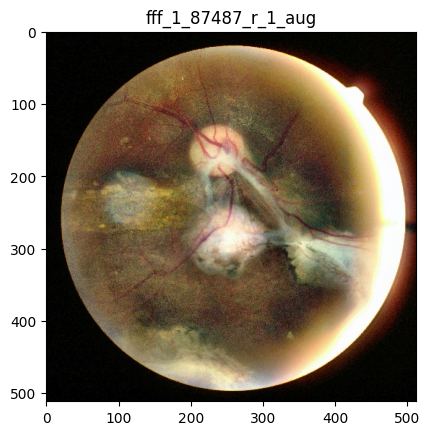

Error on threshold 0.55
Threshold: 0.57
Error on image fff_1_87487_r_1_aug


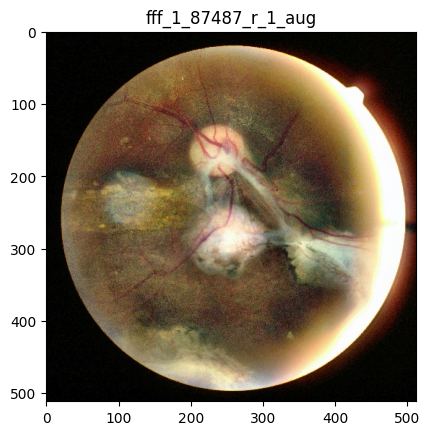

Error on threshold 0.57
Threshold: 0.59
Error on image fff_1_87487_r_1_aug


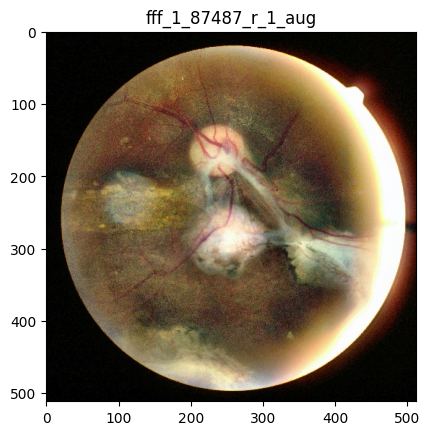

Error on image fff_1_87487_r_3_aug


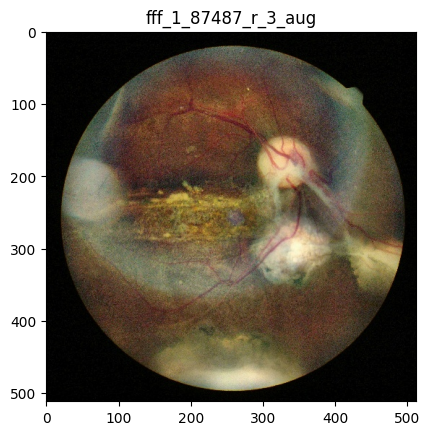

Error on threshold 0.59
Threshold: 0.61
Error on image fff_1_87487_r_1_aug


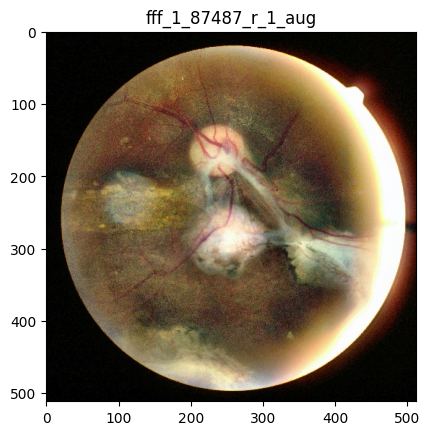

Error on image fff_1_87487_r_3_aug


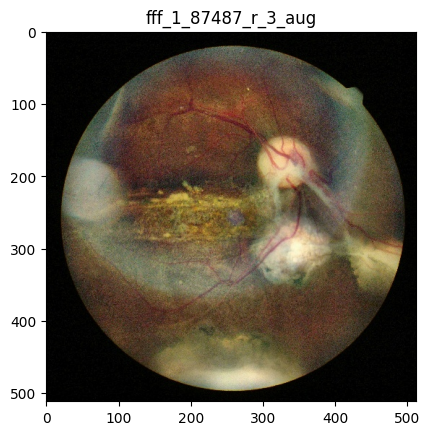

Error on threshold 0.61
Threshold: 0.63
Error on image fff_1_87487_r_1_aug


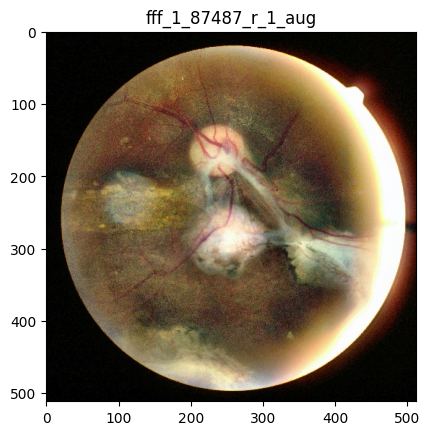

Error on image fff_1_87487_r_3_aug


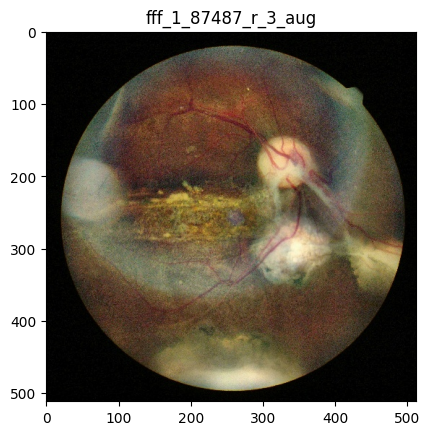

Error on threshold 0.63
Threshold: 0.66
Error on image fff_1_87487_r_1_aug


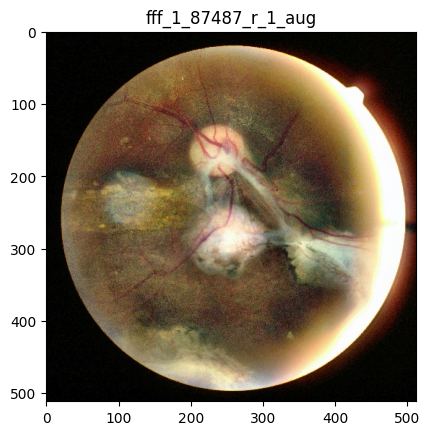

Error on image fff_1_87487_r_3_aug


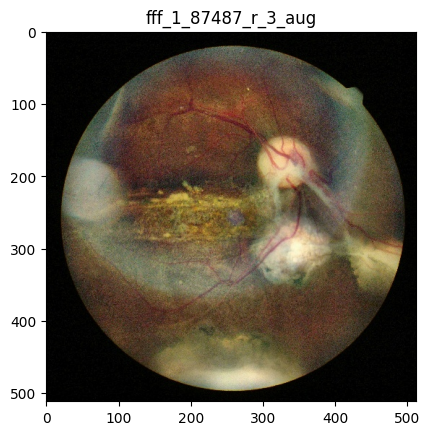

Error on threshold 0.66
Threshold: 0.68
Error on image fff_0_48763_r_2


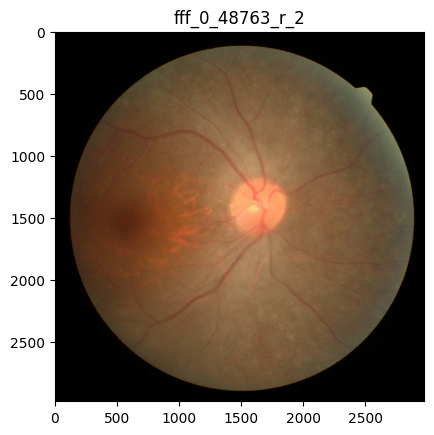

Error on threshold 0.68
Threshold: 0.7
Error on image fff_0_48763_r_2


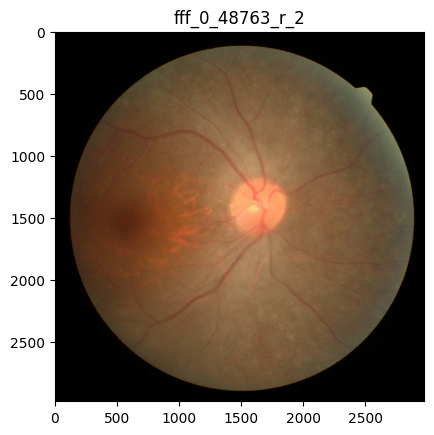

Error on threshold 0.7
Threshold: 0.72
Error on image fff_0_48763_r_2


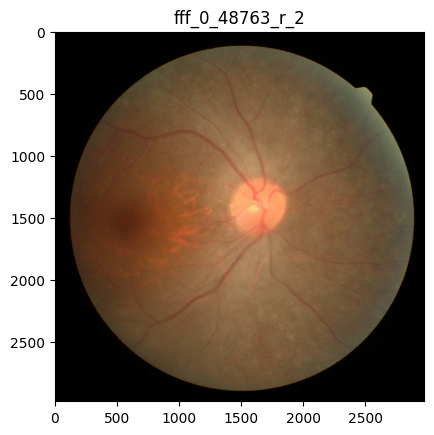

Error on threshold 0.72
Threshold: 0.74
Error on image fff_0_48763_r_2


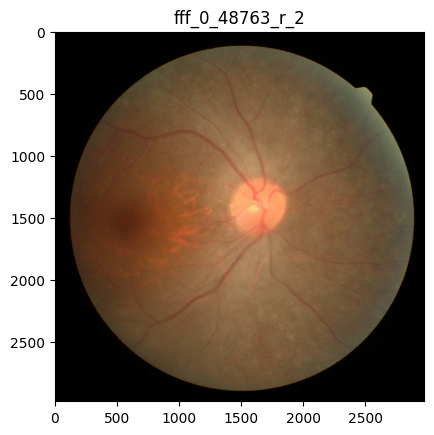

Error on threshold 0.74
Threshold: 0.76
Error on image fff_0_48763_r_2


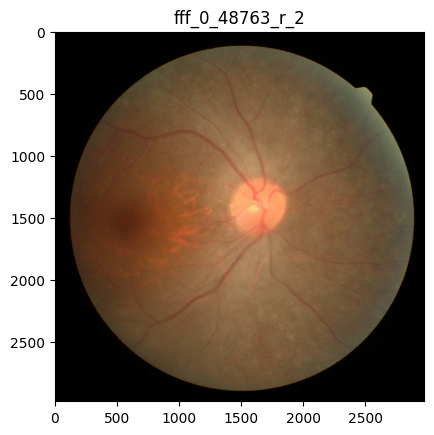

Error on image fff_1_69990_r_2


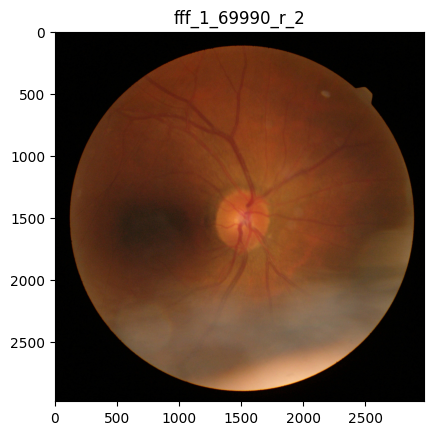

Error on threshold 0.76
Threshold: 0.78
Error on image fff_0_48763_r_2


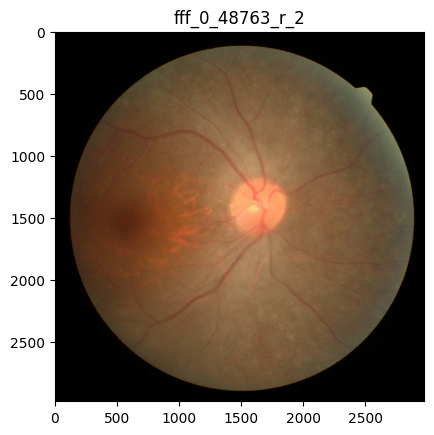

Error on image fff_1_69990_r_2


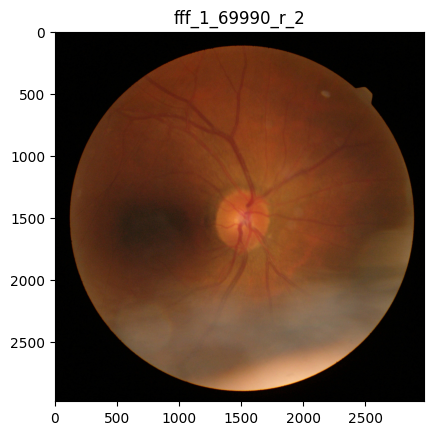

Error on threshold 0.78
Threshold: 0.8
Error on image fff_0_48763_r_2


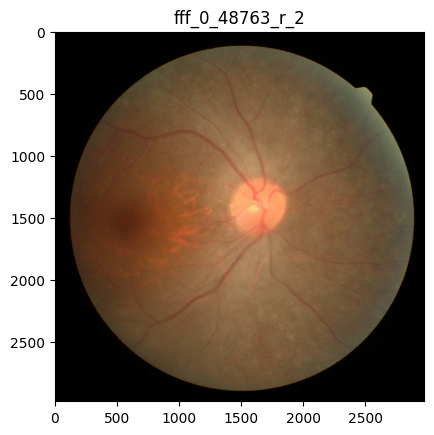

Error on image fff_1_12814_l_1


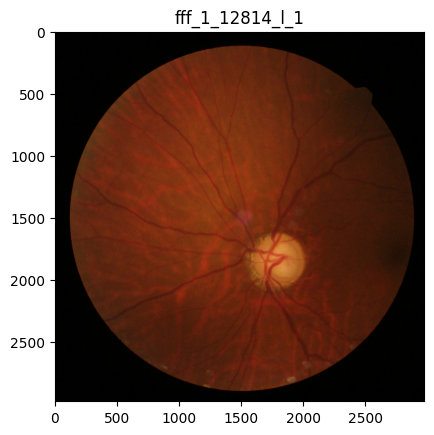

Error on image fff_1_69990_r_2


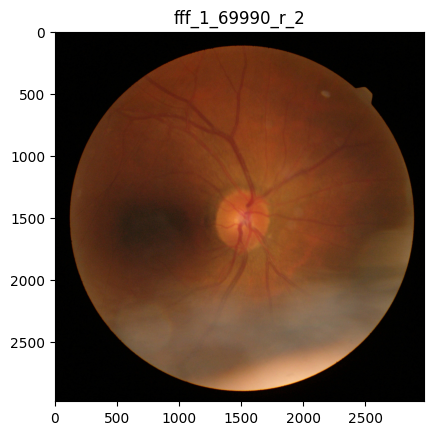

Error on threshold 0.8


In [126]:
########## count the loss value ##########
# initialize an empty dictionary to store the results
data_mnet = {
    "ori": {},
    "aug": {}
}
# iterate over the threshold values
for i in np.linspace(threshold_min, threshold_max, threshold_step):
    # round the threshold value to two decimal places
    threshold = round(i, 2)
    print(f"Threshold: {threshold}")
    
    try:
        # create an empty dataframe to store the results
        result = pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
        # get the CDR value for each image on original dataset
        for idx, row in test_img_ori.iterrows():
            result.loc[idx] = get_cdr_data_ori("mnet_model_ori", row, path_dataset_ori, threshold)
        # get the loss value
        loss = utils.count_loss_cdr(cdr_data.drop(columns=["label", "eye_side"]), result)
        data_mnet["ori"][threshold] = loss

        # create an empty dataframe to store the results
        result = pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
        # get the CDR value for each image on augmented dataset
        for idx, row in test_img_aug.iterrows():
            result.loc[idx] = get_cdr_data_aug("mnet_model_aug", row, path_dataset_aug, threshold)
        # get the loss value
        loss = utils.count_loss_cdr(cdr_data.drop(columns=["label", "eye_side"]), result)
        data_mnet["aug"][threshold] = loss
    except:
        print(f"Error on threshold {threshold}")

In [127]:
########## populate the loss dataframe ##########
# create an empty dataframe to store the results
loss_mnet = pd.DataFrame(columns=['data_type', 'threshold', 'a_mse', 'a_mae', 'a_huber', 'h_mse', 'h_mae', 'h_huber', 'v_mse', 'v_mae', 'v_huber'])
# populate the dataframe
for data_type in ["ori", "aug"]:
    for key, value in data_mnet[data_type].items():
        loss_mnet.loc[len(loss_mnet)] = [data_type, key, *list(value.values())]

loss_mnet.sort_values(by=["v_huber", "v_mse"], ascending=True, inplace=True, ignore_index=True) # sort the dataframe
loss_mnet.to_csv(os.path.join(path_full, "data", "loss_mnet.csv"), index=False)                 # save the dataframe to csv
loss_mnet_styled = loss_mnet.style.apply(highlight_max, subset=loss_mnet.columns[2:])           # highlight the minimum value

# show the dataframe
loss_mnet_styled

,data_type,threshold,a_mse,a_mae,a_huber,h_mse,h_mae,h_huber,v_mse,v_mae,v_huber
0,ori,0.340000,0.021261,0.101394,0.010631,0.023985,0.121747,0.011993,0.014124,0.088158,0.007062
1,ori,0.300000,0.019817,0.096149,0.009909,0.023730,0.120713,0.011865,0.014558,0.087834,0.007279
2,ori,0.320000,0.020939,0.098713,0.010470,0.023661,0.120378,0.011831,0.014618,0.088258,0.007309
3,ori,0.260000,0.018729,0.092612,0.009365,0.023974,0.120693,0.011987,0.014935,0.085769,0.007468
4,ori,0.280000,0.019741,0.095917,0.009871,0.024824,0.123889,0.012412,0.015032,0.088821,0.007516
5,ori,0.370000,0.023316,0.106370,0.011658,0.025896,0.132445,0.012948,0.015247,0.091844,0.007624
6,ori,0.390000,0.023989,0.108539,0.011994,0.025667,0.131892,0.012833,0.015394,0.092347,0.007697
7,ori,0.410000,0.024271,0.109996,0.012136,0.028138,0.138934,0.014069,0.015446,0.092440,0.007723
8,ori,0.200000,0.016751,0.083281,0.008376,0.019712,0.110572,0.009856,0.016023,0.095495,0.008012
9,ori,0.240000,0.017959,0.089378,0.008980,0.021077,0.114816,0.010538,0.016365,0.093029,0.008183


### EfficientNet

Threshold: 0.2
Threshold: 0.22
Threshold: 0.24
Threshold: 0.26
Threshold: 0.28
Threshold: 0.3
Threshold: 0.32
Threshold: 0.34
Threshold: 0.37
Threshold: 0.39
Threshold: 0.41
Threshold: 0.43
Threshold: 0.45
Threshold: 0.47
Threshold: 0.49
Threshold: 0.51
Threshold: 0.53
Threshold: 0.55
Threshold: 0.57
Threshold: 0.59
Threshold: 0.61
Threshold: 0.63
Threshold: 0.66
Threshold: 0.68
Threshold: 0.7
Error on image fff_0_48763_r_2_aug


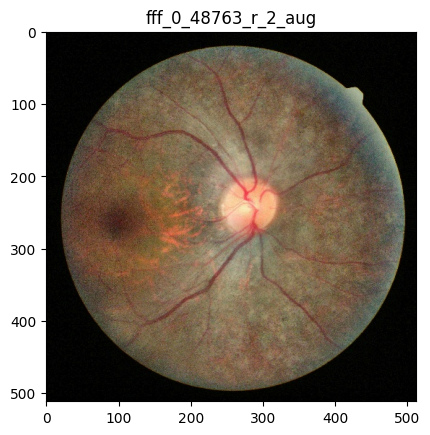

Error on threshold 0.7
Threshold: 0.72
Error on image fff_0_48763_r_2_aug


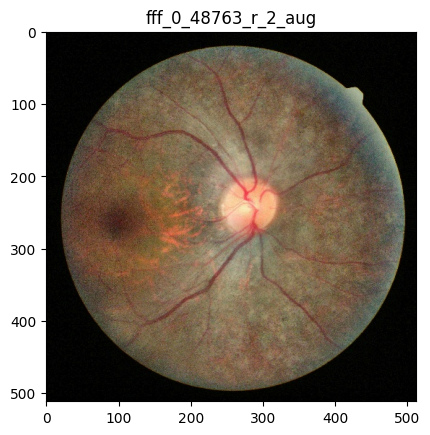

Error on threshold 0.72
Threshold: 0.74
Error on image fff_0_48763_r_2_aug


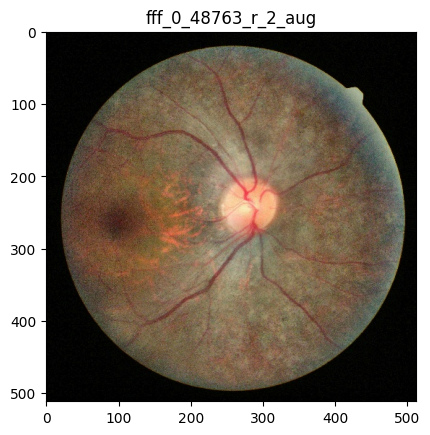

Error on threshold 0.74
Threshold: 0.76
Error on image fff_0_48763_r_2_aug


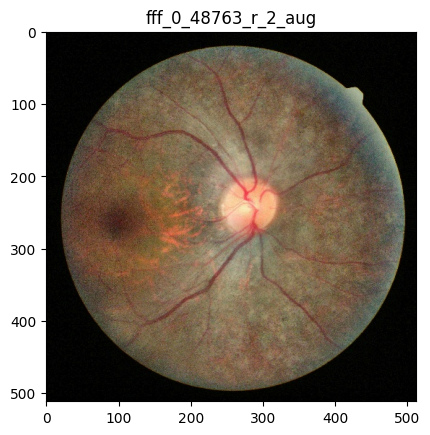

Error on threshold 0.76
Threshold: 0.78
Error on image fff_0_48763_r_2_aug


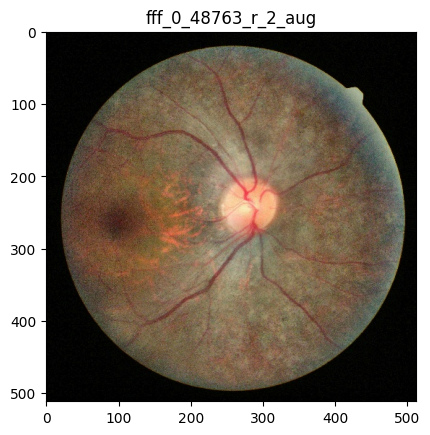

Error on threshold 0.78
Threshold: 0.8
Error on image fff_0_48763_r_2


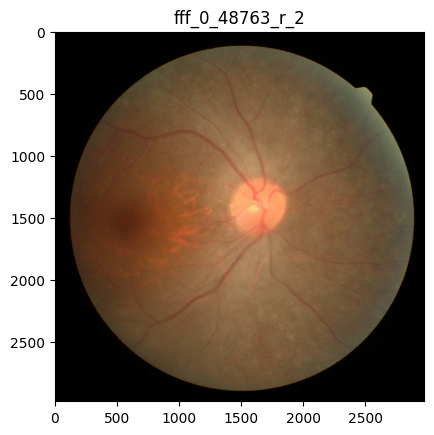

Error on image fff_1_12814_l_1


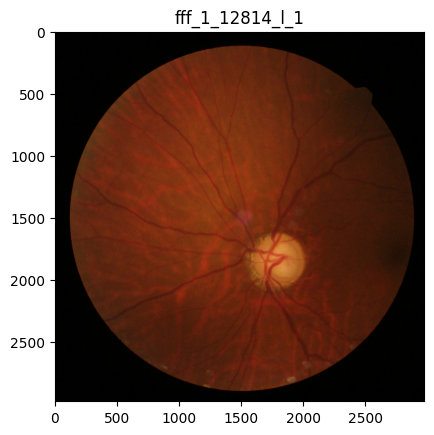

Error on threshold 0.8


In [128]:
########## count the loss value ##########
# initialize an empty dictionary to store the results
data_efnet = {
    "ori": {},
    "aug": {}
}
# iterate over the threshold values
for i in np.linspace(threshold_min, threshold_max, threshold_step):
    # round the threshold value to two decimal places
    threshold = round(i, 2)
    print(f"Threshold: {threshold}")
    
    try:
        # create an empty dataframe to store the results
        result = pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
        # get the CDR value for each image on original dataset
        for idx, row in test_img_ori.iterrows():
            result.loc[idx] = get_cdr_data_ori("efnet_model_ori", row, path_dataset_ori, threshold)
        # get the loss value
        loss = utils.count_loss_cdr(cdr_data.drop(columns=["label", "eye_side"]), result)
        data_efnet["ori"][threshold] = loss

        # create an empty dataframe to store the results
        result = pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
        # get the CDR value for each image on augmented dataset
        for idx, row in test_img_aug.iterrows():
            result.loc[idx] = get_cdr_data_aug("efnet_model_aug", row, path_dataset_aug, threshold)
        # get the loss value
        loss = utils.count_loss_cdr(cdr_data.drop(columns=["label", "eye_side"]), result)
        data_efnet["aug"][threshold] = loss
    except:
        print(f"Error on threshold {threshold}")

In [129]:
########## populate the loss dataframe ##########
# create an empty dataframe to store the results
loss_efnet = pd.DataFrame(columns=['data_type', 'threshold', 'a_mse', 'a_mae', 'a_huber', 'h_mse', 'h_mae', 'h_huber', 'v_mse', 'v_mae', 'v_huber'])
# populate the dataframe
for data_type in ["ori", "aug"]:
    for key, value in data_efnet[data_type].items():
        loss_efnet.loc[len(loss_efnet)] = [data_type, key, *list(value.values())]

loss_efnet.sort_values(by=["v_huber", "v_mse"], ascending=True, inplace=True, ignore_index=True)    # sort the dataframe
loss_efnet.to_csv(os.path.join(path_full, "data", "loss_efnet.csv"), index=False)                   # save the dataframe to csv
loss_efnet_styled = loss_efnet.style.apply(highlight_max, subset=loss_efnet.columns[2:])            # highlight the minimum value

# show the dataframe
loss_efnet_styled

,data_type,threshold,a_mse,a_mae,a_huber,h_mse,h_mae,h_huber,v_mse,v_mae,v_huber
0,ori,0.260000,0.011381,0.061730,0.005690,0.022838,0.125424,0.011419,0.017731,0.097949,0.008865
1,aug,0.240000,0.011386,0.065003,0.005693,0.038789,0.129152,0.019156,0.018581,0.096875,0.009290
2,ori,0.280000,0.011544,0.063589,0.005772,0.022618,0.125345,0.011309,0.019886,0.104926,0.009943
3,aug,0.220000,0.011476,0.065247,0.005738,0.041063,0.130311,0.020293,0.020993,0.100355,0.010497
4,ori,0.240000,0.011643,0.066158,0.005822,0.026414,0.129625,0.013207,0.021959,0.107332,0.010980
5,aug,0.280000,0.012575,0.070984,0.006287,0.018701,0.113934,0.009350,0.027811,0.108088,0.013905
6,ori,0.220000,0.011328,0.065648,0.005664,0.030728,0.130655,0.015364,0.027916,0.118776,0.013958
7,aug,0.260000,0.011691,0.068323,0.005846,0.038613,0.128582,0.019067,0.027922,0.108758,0.013961
8,ori,0.200000,0.010119,0.064820,0.005060,0.034791,0.138971,0.017396,0.032604,0.122308,0.016302
9,aug,0.390000,0.014611,0.078395,0.007305,0.026324,0.122362,0.013162,0.033927,0.116734,0.016964


## Visualize the extracted image

In [130]:
# get the random index for the image
rand_idx = randint(0, len(test_img_ori))
threshold = {}

# populate the threshold value
for model_loss, model_name in zip([loss_unet, loss_mnet, loss_efnet],
                                    ["unet", "mnet", "efnet"]):
    for data_type in ["ori", "aug"]:
        threshold[f"{model_name}_{data_type}"] = model_loss.loc[model_loss.data_type == data_type].iloc[0, 1]
# show the threshold value
threshold

{'unet_ori': 0.22,
 'unet_aug': 0.74,
 'mnet_ori': 0.34,
 'mnet_aug': 0.2,
 'efnet_ori': 0.26,
 'efnet_aug': 0.24}

#### Unet

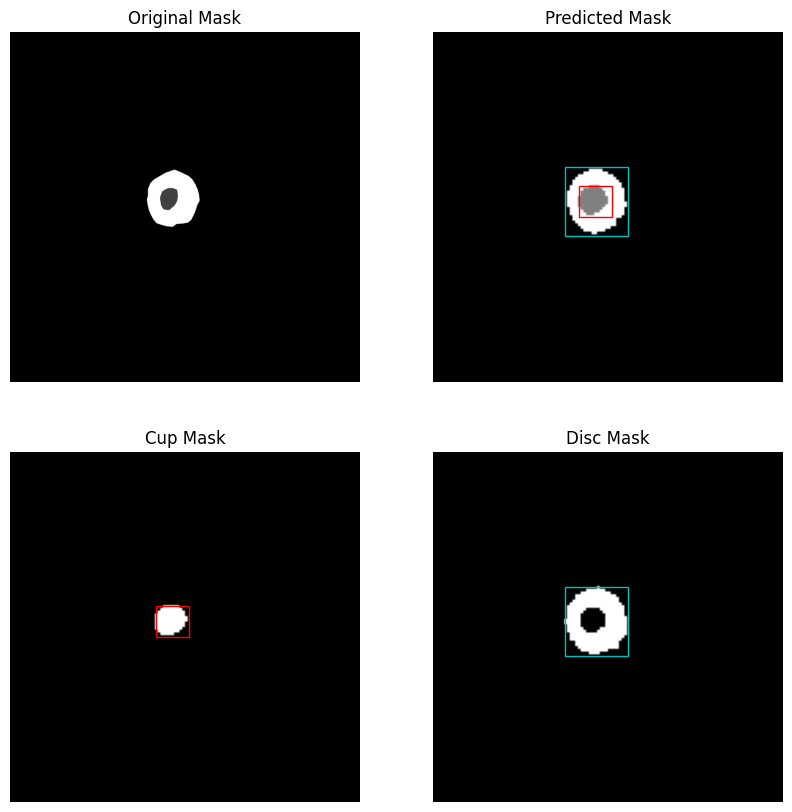

The ID of the image is fff_0_18451_r_2
Here is the CDR from ORIGINAL IMAGE values:
area_cdr: 0.2447058823529412
horizontal_cdr: 0.5217391304347826
vertical_cdr: 0.44


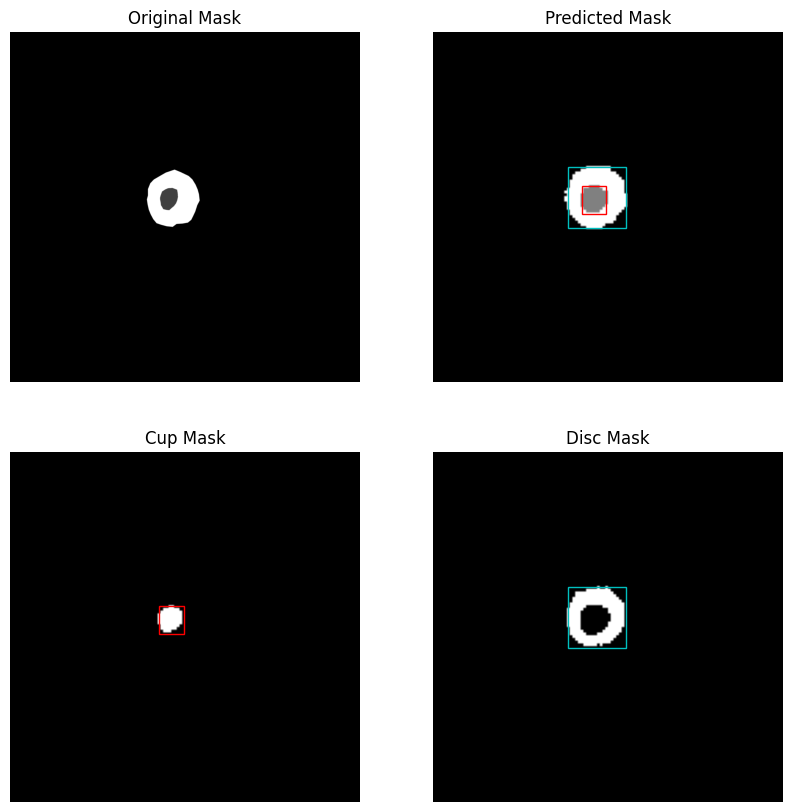

The ID of the image is fff_0_18451_r_2_aug
Here is the CDR from AUGMENTED IMAGE values:
area_cdr: 0.20238095238095238
horizontal_cdr: 0.42857142857142855
vertical_cdr: 0.45454545454545453


In [131]:
# original image
## visualize the mask image and calculate the CDR
result = utils.ev_cdr(model=model["unet_model_ori"],
                        img_path=test_img_ori.path[rand_idx],
                        mask_path=os.path.join(path_dataset_ori,
                                                f"{test_img_ori.id[rand_idx]}_mask.png"),
                        threshold=threshold["unet_ori"],
                        visualize=True)
## show cdr result
print(f"The ID of the image is {test_img_ori.id[rand_idx]}", "Here is the CDR from ORIGINAL IMAGE values:", sep="\n")
for key, value in result.items():
    print(f"{key}: {value}")

# augmented image
## visualize the mask image and calculate the CDR
result = utils.ev_cdr(model=model["unet_model_aug"],
                        img_path=test_img_aug.path[rand_idx],
                        mask_path=os.path.join(path_dataset_aug,
                                                f"{test_img_aug.id[rand_idx].replace('aug', 'mask')}.png"),
                        threshold=threshold["unet_aug"],
                        visualize=True)
## show cdr result
print(f"The ID of the image is {test_img_aug.id[rand_idx]}", "Here is the CDR from AUGMENTED IMAGE values:", sep="\n")
for key, value in result.items():
    print(f"{key}: {value}")

#### MobileNet

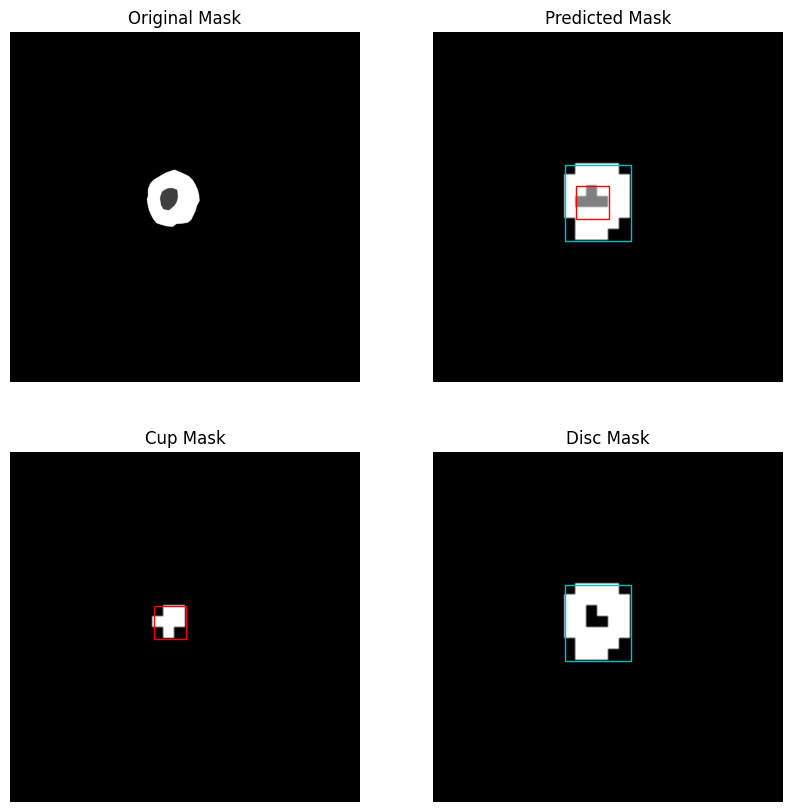

The ID of the image is fff_0_18451_r_2
Here is the CDR from ORIGINAL IMAGE values:
area_cdr: 0.17142857142857143
horizontal_cdr: 0.5
vertical_cdr: 0.42857142857142855


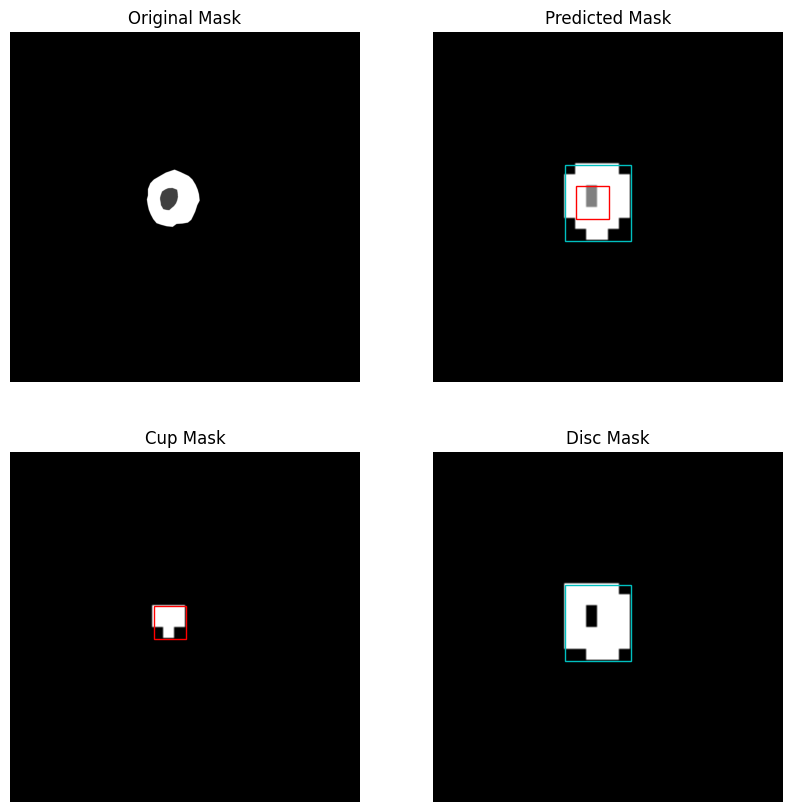

The ID of the image is fff_0_18451_r_2_aug
Here is the CDR from AUGMENTED IMAGE values:
area_cdr: 0.18421052631578946
horizontal_cdr: 0.5
vertical_cdr: 0.42857142857142855


In [132]:
# original image
## visualize the mask image and calculate the CDR
result = utils.ev_cdr(model=model["mnet_model_ori"],
                        img_path=test_img_ori.path[rand_idx],
                        mask_path=os.path.join(path_dataset_ori,
                                                f"{test_img_ori.id[rand_idx]}_mask.png"),
                        threshold=threshold["mnet_ori"],
                        visualize=True)
## show cdr result
print(f"The ID of the image is {test_img_ori.id[rand_idx]}", "Here is the CDR from ORIGINAL IMAGE values:", sep="\n")
for key, value in result.items():
    print(f"{key}: {value}")

# augmented image
## visualize the mask image and calculate the CDR
result = utils.ev_cdr(model=model["mnet_model_aug"],
                        img_path=test_img_aug.path[rand_idx],
                        mask_path=os.path.join(path_dataset_aug,
                                                f"{test_img_aug.id[rand_idx].replace('aug', 'mask')}.png"),
                        threshold=threshold["mnet_aug"],
                        visualize=True)
## show cdr result
print(f"The ID of the image is {test_img_aug.id[rand_idx]}", "Here is the CDR from AUGMENTED IMAGE values:", sep="\n")
for key, value in result.items():
    print(f"{key}: {value}")

#### EfficientNet

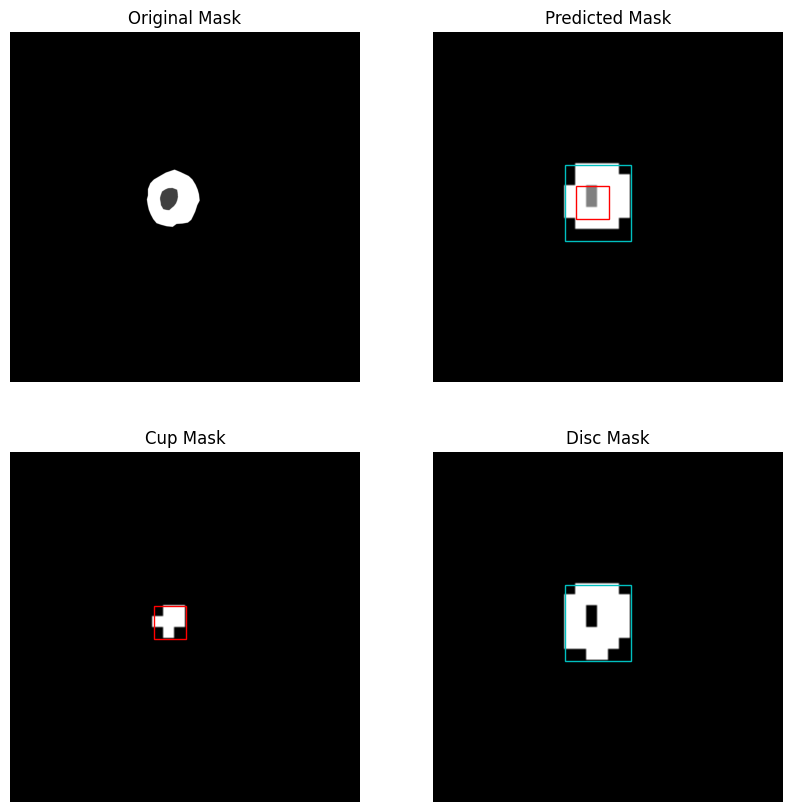

The ID of the image is fff_0_18451_r_2
Here is the CDR from ORIGINAL IMAGE values:
area_cdr: 0.17142857142857143
horizontal_cdr: 0.5
vertical_cdr: 0.42857142857142855


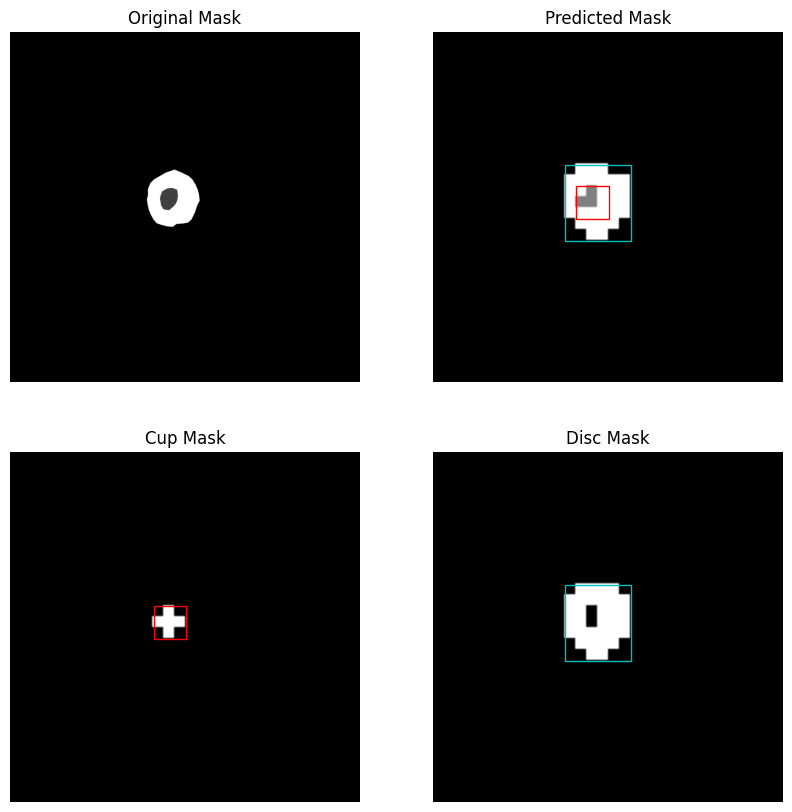

The ID of the image is fff_0_18451_r_2_aug
Here is the CDR from AUGMENTED IMAGE values:
area_cdr: 0.14705882352941177
horizontal_cdr: 0.5
vertical_cdr: 0.42857142857142855


In [133]:
# original image
## visualize the mask image and calculate the CDR
result = utils.ev_cdr(model=model["efnet_model_ori"],
                        img_path=test_img_ori.path[rand_idx],
                        mask_path=os.path.join(path_dataset_ori,
                                                f"{test_img_ori.id[rand_idx]}_mask.png"),
                        threshold=threshold["efnet_ori"],
                        visualize=True)
## show cdr result
print(f"The ID of the image is {test_img_ori.id[rand_idx]}", "Here is the CDR from ORIGINAL IMAGE values:", sep="\n")
for key, value in result.items():
    print(f"{key}: {value}")

# augmented image
## visualize the mask image and calculate the CDR
result = utils.ev_cdr(model=model["efnet_model_aug"],
                        img_path=test_img_aug.path[rand_idx],
                        mask_path=os.path.join(path_dataset_aug,
                                                f"{test_img_aug.id[rand_idx].replace('aug', 'mask')}.png"),
                        threshold=threshold["efnet_aug"],
                        visualize=True)
## show cdr result
print(f"The ID of the image is {test_img_aug.id[rand_idx]}", "Here is the CDR from AUGMENTED IMAGE values:", sep="\n")
for key, value in result.items():
    print(f"{key}: {value}")

## Get the CDR value from the predicted mask

### Unet

In [134]:
# create an empty dataframe to store the results
ev_cdr_unet = {
    "ori": pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"]),
    "aug": pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
}

# get the CDR value for each image on original dataset
for idx, row in test_img_ori.iterrows():
    ev_cdr_unet['ori'].loc[idx] = get_cdr_data_ori("unet_model_ori", row, path_dataset_ori, threshold["unet_ori"])
print("completed the original dataset")

# get the CDR value for each image on augmented dataset
for idx, row in test_img_aug.iterrows():
    ev_cdr_unet['aug'].loc[idx] = get_cdr_data_aug("unet_model_aug", row, path_dataset_aug, threshold["unet_aug"])
print("completed the augmented dataset")

completed the original dataset
completed the augmented dataset


In [135]:
# save the data into csv
for key, value in ev_cdr_unet.items():
    value.to_csv(os.path.join(path_full, "data", f"cdr_unet_{key}.csv"), index=False)

### MobileNet

In [136]:
# create an empty dataframe to store the results
ev_cdr_mnet = {
    "ori": pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"]),
    "aug": pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
}

# get the CDR value for each image on original dataset
for idx, row in test_img_ori.iterrows():
    ev_cdr_mnet['ori'].loc[idx] = get_cdr_data_ori("mnet_model_ori", row, path_dataset_ori, threshold["mnet_ori"])
print("completed the original dataset")

# get the CDR value for each image on augmented dataset
for idx, row in test_img_aug.iterrows():
    ev_cdr_mnet['aug'].loc[idx] = get_cdr_data_aug("mnet_model_aug", row, path_dataset_aug, threshold["mnet_aug"])
print("completed the augmented dataset")

completed the original dataset
completed the augmented dataset


In [137]:
# save the data into csv
for key, value in ev_cdr_mnet.items():
    value.to_csv(os.path.join(path_full, "data", f"cdr_mnet_{key}.csv"), index=False)

### EfficientNet

In [138]:
# create an empty dataframe to store the results
ev_cdr_efnet = {
    "ori": pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"]),
    "aug": pd.DataFrame(columns=["id", "a_cdr", "v_cdr", "h_cdr"])
}

# get the CDR value for each image on original dataset
for idx, row in test_img_ori.iterrows():
    ev_cdr_efnet['ori'].loc[idx] = get_cdr_data_ori("efnet_model_ori", row, path_dataset_ori, threshold["efnet_ori"])
print("completed the original dataset")
    
# get the CDR value for each image on augmented dataset
for idx, row in test_img_aug.iterrows():
    ev_cdr_efnet['aug'].loc[idx] = get_cdr_data_aug("efnet_model_aug", row, path_dataset_aug, threshold["efnet_aug"])
print("completed the augmented dataset")

completed the original dataset
completed the augmented dataset


In [139]:
# save the data into csv
for key, value in ev_cdr_efnet.items():
    value.to_csv(os.path.join(path_full, "data", f"cdr_efnet_{key}.csv"), index=False)

## Get Class
- Get the class from pred CDR value and real class
- Count the accuracy from it

In [7]:
# intiate the used metrics
acc = tf.keras.metrics.Accuracy()
auc = tf.keras.metrics.AUC()
prc = tf.keras.metrics.Precision()
rec = tf.keras.metrics.Recall()

In [8]:
# get the CDR data for the original dataset and the augmented dataset
ev_cdr_unet = {     # unet model
    "ori": pd.read_csv(os.path.join(path_full, "data", "cdr_unet_ori.csv")),
    "aug": pd.read_csv(os.path.join(path_full, "data", "cdr_unet_aug.csv"))
}
ev_cdr_mnet = {     # mnet model
    "ori": pd.read_csv(os.path.join(path_full, "data", "cdr_mnet_ori.csv")),
    "aug": pd.read_csv(os.path.join(path_full, "data", "cdr_mnet_aug.csv"))
}
ev_cdr_efnet = {    # efnet model
    "ori": pd.read_csv(os.path.join(path_full, "data", "cdr_efnet_ori.csv")),
    "aug": pd.read_csv(os.path.join(path_full, "data", "cdr_efnet_aug.csv"))
}

In [9]:
def get_class(ev_cdr:pd.DataFrame, save_path:str, threshold:float=.5):
    """get the class of the CDR

    Args:
        ev_cdr (pd.DataFrame): the dataframe of the CDR data
        save_path (str): the path to save the data
        threshold (float, optional): the threshold value. Defaults to .5.
    
    Returns:
        pd.DataFrame: the dataframe of the CDR data with the class
    """
    # create an empty dataframe to store the results
    test_data = pd.DataFrame(columns=list(ev_cdr.columns) + ["real_class"])
    # rename the columns
    test_data.rename(columns={"a_cdr": "a_class", "v_cdr": "v_class", "h_cdr": "h_class"}, inplace=True)

    # get the class predicted from CDR value
    for idx, row in ev_cdr.iterrows():
        test_data.loc[idx] = [row.id,
                                1 if row.a_cdr > threshold else 0,
                                1 if row.v_cdr > threshold else 0,
                                1 if row.h_cdr > threshold else 0,
                                row.id.split("_")[1]]
    # save the data into csv
    test_data.to_csv(save_path, index=False)

    return test_data

In [10]:
def get_metrics(test_data:pd.DataFrame,
                acc:tf.keras.metrics.Accuracy,
                auc:tf.keras.metrics.AUC,
                prc:tf.keras.metrics.Precision,
                rec:tf.keras.metrics.Recall):
    """get the metrics value from the classification

    Args:
        test_data (pd.DataFrame): the dataframe of the data
        acc (tf.keras.metrics.Accuracy): the accuracy metric
        auc (tf.keras.metrics.AUC): the AUC metric
        prc (tf.keras.metrics.Precision): the precision metric
        rec (tf.keras.metrics.Recall): the recall metric

    Returns:
        dict: the dictionary that contains the metrics
    """
    # reset the metrics state
    acc.reset_states()
    auc.reset_states()
    prc.reset_states()
    rec.reset_states()
    
    # update the metrics state (calculate the metrics value)
    acc.update_state(test_data.real_class.astype(int).values,   # accuracy (akurasi)
                    test_data.v_class.astype(int).values)
    auc.update_state(test_data.real_class.astype(int).values,   # AUC (auc)
                    test_data.v_class.astype(int).values)
    prc.update_state(test_data.real_class.astype(int).values,   # precision (presisi)
                    test_data.v_class.astype(int).values)
    rec.update_state(test_data.real_class.astype(int).values,   # recall (sensitivitas)
                    test_data.v_class.astype(int).values)
    
    # get the metrics numerical value
    return {
        "accuracy": acc.result().numpy(),
        "auc": auc.result().numpy(),
        "precision": prc.result().numpy(),
        "recall": rec.result().numpy(),
        "f1": 2 * (prc.result().numpy() * rec.result().numpy()) / (prc.result().numpy() + rec.result().numpy())
    }

### Unet

In [11]:
# empty dictionary to store the test data
test_data_unet = {}

# get the class of the CDR data
for data_type in ev_cdr_unet.keys():
    test_data_unet[data_type] = get_class(ev_cdr_unet[data_type],
                                            os.path.join(path_full, "data", f"class_result_unet_{data_type}.csv"))
    print(f"The result for {data_type} dataset", test_data_unet[data_type].head(3), sep="\n", end="\n\n")

# get the metrics value
for data_type in test_data_unet.keys():
    print(f"The metrics result for {data_type} dataset",
        get_metrics(test_data_unet[data_type], acc, auc, prc, rec), sep="\n", end="\n\n")

The result for ori dataset
                 id  a_class  v_class  h_class real_class
0  fff_0_115058_l_1        0        1        0          0
1  fff_0_115058_r_3        0        1        0          0
2  fff_0_121076_r_1        0        1        0          0

The result for aug dataset
                     id  a_class  v_class  h_class real_class
0  fff_0_115058_l_1_aug        0        1        0          0
1  fff_0_115058_r_3_aug        0        1        0          0
2  fff_0_121076_r_1_aug        0        0        0          0

The metrics result for ori dataset
{'accuracy': 0.6056338, 'auc': 0.5918124, 'precision': 0.5762712, 'recall': 0.9189189, 'f1': 0.7083333200452475}

The metrics result for aug dataset
{'accuracy': 0.85915494, 'auc': 0.85294116, 'precision': 0.78723407, 'recall': 1.0, 'f1': 0.8809523968334368}



### MobileNet

In [12]:
# empty dictionary to store the test data
test_data_mnet = {}

# get the class of the CDR data
for data_type in ev_cdr_mnet.keys():
    test_data_mnet[data_type] = get_class(ev_cdr_mnet[data_type],
                                            os.path.join(path_full, "data", f"class_result_mnet_{data_type}.csv"))
    print(f"The result for {data_type} dataset", test_data_mnet[data_type].head(3), sep="\n", end="\n\n")

# get the metrics value
for data_type in test_data_mnet.keys():
    print(f"The metrics result for {data_type} dataset",
        get_metrics(test_data_mnet[data_type], acc, auc, prc, rec), sep="\n", end="\n\n")

The result for ori dataset
                 id  a_class  v_class  h_class real_class
0  fff_0_115058_l_1        0        0        0          0
1  fff_0_115058_r_3        0        1        0          0
2  fff_0_121076_r_1        0        0        0          0

The result for aug dataset
                     id  a_class  v_class  h_class real_class
0  fff_0_115058_l_1_aug        0        0        0          0
1  fff_0_115058_r_3_aug        0        1        0          0
2  fff_0_121076_r_1_aug        0        0        0          0

The metrics result for ori dataset
{'accuracy': 0.8169014, 'auc': 0.82074714, 'precision': 0.9, 'recall': 0.7297297, 'f1': 0.805970069556623}

The metrics result for aug dataset
{'accuracy': 0.74647886, 'auc': 0.74841017, 'precision': 0.7878788, 'recall': 0.7027027, 'f1': 0.7428571908421562}



### EfficientNet

In [13]:
# empty dictionary to store the test data
test_data_efnet = {}

# get the class of the CDR data
for data_type in ev_cdr_efnet.keys():
    test_data_efnet[data_type] = get_class(ev_cdr_efnet[data_type],
                                            os.path.join(path_full, "data", f"class_result_efnet_{data_type}.csv"))
    print(f"The result for {data_type} dataset", test_data_efnet[data_type].head(3), sep="\n", end="\n\n")

# get the metrics value
for data_type in test_data_efnet.keys():
    print(f"The metrics result for {data_type} dataset",
        get_metrics(test_data_efnet[data_type], acc, auc, prc, rec), sep="\n", end="\n\n")

The result for ori dataset
                 id  a_class  v_class  h_class real_class
0  fff_0_115058_l_1        0        1        0          0
1  fff_0_115058_r_3        0        0        0          0
2  fff_0_121076_r_1        0        0        0          0

The result for aug dataset
                     id  a_class  v_class  h_class real_class
0  fff_0_115058_l_1_aug        0        0        0          0
1  fff_0_115058_r_3_aug        0        1        0          0
2  fff_0_121076_r_1_aug        0        0        0          0

The metrics result for ori dataset
{'accuracy': 0.8028169, 'auc': 0.8036566, 'precision': 0.82857144, 'recall': 0.7837838, 'f1': 0.8055555555555556}

The metrics result for aug dataset
{'accuracy': 0.7746479, 'auc': 0.77305245, 'precision': 0.7692308, 'recall': 0.8108108, 'f1': 0.7894736445016165}

